# Scientific question

Are driver mutations better predicted by searching for an excess of somatic mutations in CCRs vs random locations? 

# Data

I used `bedtools` to intersect constrained coding regions (CCRs), defined by exonic regions lying between consecutive [gnomAD](http://gnomad.broadinstitute.org/) variants, with somatic mutations observed in cancer genomes ([COSMIC](https://cancer.sanger.ac.uk/cosmic/download)). The result of this analysis was a `pickle` file containing the total multi-exonic length and number of somatic mutations for each CCR: 

In [1]:
import pandas as pd
df = pd.read_pickle('ccrs.v2.20180420.lengths_numberMutations.pkl')
df.head()

,unique_key,total_number_of_mutations,total_length,chrom,ccr_pct,gene,ranges,varflag,syn_density,cpg,cov_score,resid,resid_pctile
0,1,33,338,4,100.000000,DHX15,"24541797-24541922,24542462-24542571,24543495-2...","VARFALSE,VARFALSE,VARFALSE",0.068,0.02,335.59,46.489,100.000000
1,2,21,319,2,99.997902,SF3B1,"198257731-198257912,198260779-198260917","VARFALSE,VARFALSE",0.088,0.03,318.98,44.129,95.141301
2,3,79,295,1,99.997028,PBX1,"164769048-164769126,164776778-164776914,164781...","VARFALSE,VARFALSE,VARFALSE",0.088,0.09,295.00,40.662,88.002426
3,4,58,290,4,99.995827,UBE2D3,"103720577-103720657,103722610-103722716,103723...","VARFALSE,VARFALSE,VARFALSE,VARFALSE",0.066,0.02,286.98,39.622,85.860636
4,5,32,295,2,99.994760,SF3B1,"198267496-198267550,198267672-198267759,198268...","VARFALSE,VARFALSE,VARFALSE",0.037,0.04,280.62,38.697,83.956102


# Modeling the mutation rate 

We assume that the above mutation-count data were generated by a Poisson process with a count function $H_\theta(l, x) = lh_\theta(x)$, where 
$l$ is the length of a CCR, $x$ is a feature (e.g. CpG density), and
$\theta$ is a  parameter vector that dictates the form of the function. 



Features such as CpG density are assumed to be non-noisy. Yet a computation of CpG density from a very small CCR is subject to sampling noise, e.g. the CpG density of a CCR of length 2 can only be 0 or 1. In an effort to average out this noise, I restricted the analysis to CCRs of length larger than a threshold value:

In [2]:
# df = df[df.total_length>20]
sample_size = len(df)

I will represent $h_\theta(x)$, the estimated mutation rate, by a neural network, since neural networks have the capacity to represent any function. In the spirit of choosing the simplest model possible, I will consider the special case of [Poisson Regression](https://en.wikipedia.org/wiki/Poisson_regression), which can be viewed as a neural network that has no hidden layers and an activation function (called an inverse link function in the generalized-linear-model literature) equal to: 

\begin{equation}
h_\theta(x) =  e^{b + Wx} ,
\end{equation}

where $\theta = (b, W)$. The exponential guarantees that the rate is non-negative, as it must be. 



In [3]:
import tensorflow as tf
import os 

# turn off tensorflow warning messages 
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

number_exposure_input_nodes = 1 # the "l"s are called "exposures" in the Poisson regression literature
number_feature_input_nodes = 1 # can be increased as more features are added
number_hidden_nodes = 1 # can be increased to go beyond Poisson regression
number_output_nodes = 1

tf.set_random_seed(1)

# use "variable scopes" to help tensorflow produce readable diagrams of the computational graph in tensorboard: 

# exposure input
with tf.variable_scope('exposure_input_layer'): 
    l = tf.placeholder(tf.float32, shape=(sample_size, number_exposure_input_nodes)) 

# feature inputs 
with tf.variable_scope('feature_input_layer'): 
    X = tf.placeholder(tf.float32, shape=(sample_size, number_feature_input_nodes)) 
    
# hidden layer (placeholder for later development beyond Poisson regression)
with tf.variable_scope('hidden_layer'): 
    hidden_layer_output = X 
    
# output layer
with tf.variable_scope('output_layer'): 
    weights = tf.get_variable(name="output_weights", 
                              shape=(number_hidden_nodes, number_output_nodes),
                              initializer=tf.contrib.layers.xavier_initializer()) 
    biases = tf.get_variable(name="output_biases", 
                             shape=number_output_nodes,
                             initializer=tf.zeros_initializer())    
    h = tf.exp(tf.matmul(hidden_layer_output, weights) + biases)
    prediction = l*h

Instructions for updating:
Use the retry module or similar alternatives.


# Cost function

We attempt to reconstruct the true mutation rate by the principle of maximum likelihood. The corresponding objective function to minimize is: 

\begin{equation}
{\cal L}(\theta \, | \, x_1, \ldots, x_m; l_1, \ldots, l_m; n_1, \ldots, n_m) = \frac{1}{m} \sum_{i=1}^m \left[ \, 
H_i(\theta) - n_i \log H_i(\theta) + \log \left( n_i! \right)
\, \right] ,
\end{equation}

where $H_i(\theta) = l_i h_\theta(x_i)$ is the "predicted" count for CCR $i$ and $n_i$ is the "actual"  count. 




In [4]:
with tf.variable_scope('cost'):
    y = tf.placeholder(tf.float32, shape=(sample_size, 1))
    cost = tf.reduce_mean(prediction - y*tf.log(prediction+1e-10) + tf.lgamma(y+1.0))

# Training the model

In [5]:
import numpy as np

feed_dict = {l:df[['total_length']].values, 
             X:df[['cpg']].values, 
             y:df[['total_number_of_mutations']].values}

with tf.variable_scope('train'): 
    training_step = tf.train.AdamOptimizer(learning_rate=0.1).minimize(cost)
    
log_df = pd.DataFrame(columns=['epoch', 'cost', 'likelihood', 'bias', 'weight'])
i = 0

with tf.Session() as session: 
    session.run(tf.global_variables_initializer())     
    for epoch in range(300): 
        _, cost_eval, prediction_eval, h_eval = session.run([training_step, cost, prediction, h], feed_dict=feed_dict)
        if epoch % 10 == 0: 
            bias_eval = float(biases.eval())
            weight_eval = float(weights.eval())
            log_df.loc[i] = [epoch, 
                             cost_eval, 
                             np.exp(-sample_size*cost_eval), 
                             bias_eval, 
                             weight_eval]
            i += 1

The cost decreases as the network is trained on the data: 

In [6]:
log_df

,epoch,cost,likelihood,bias,weight
0,0.0,5.419358,0.0,-0.100000,-1.154451
1,10.0,2.083513,0.0,-1.026748,-2.040001
2,20.0,1.351167,0.0,-1.689399,-2.508135
3,30.0,1.246017,0.0,-2.062984,-2.538751
4,40.0,1.242925,0.0,-2.226961,-2.273907
5,50.0,1.245092,0.0,-2.267540,-1.846892
6,60.0,1.236809,0.0,-2.248777,-1.350064
7,70.0,1.226362,0.0,-2.211997,-0.845057
8,80.0,1.222139,0.0,-2.180433,-0.373621
9,90.0,1.218151,0.0,-2.163490,0.037728


# Detecting outliers

This compares the observed mutation count $n_i$ for CCR $i$ with its expected count $H_i(\theta)$:


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x117e25e90>]],
      dtype=object)

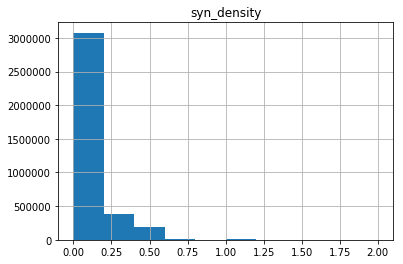

In [7]:
%matplotlib inline
df.hist(column='syn_density')

In [8]:
df.head()

,unique_key,total_number_of_mutations,total_length,chrom,ccr_pct,gene,ranges,varflag,syn_density,cpg,cov_score,resid,resid_pctile
0,1,33,338,4,100.000000,DHX15,"24541797-24541922,24542462-24542571,24543495-2...","VARFALSE,VARFALSE,VARFALSE",0.068,0.02,335.59,46.489,100.000000
1,2,21,319,2,99.997902,SF3B1,"198257731-198257912,198260779-198260917","VARFALSE,VARFALSE",0.088,0.03,318.98,44.129,95.141301
2,3,79,295,1,99.997028,PBX1,"164769048-164769126,164776778-164776914,164781...","VARFALSE,VARFALSE,VARFALSE",0.088,0.09,295.00,40.662,88.002426
3,4,58,290,4,99.995827,UBE2D3,"103720577-103720657,103722610-103722716,103723...","VARFALSE,VARFALSE,VARFALSE,VARFALSE",0.066,0.02,286.98,39.622,85.860636
4,5,32,295,2,99.994760,SF3B1,"198267496-198267550,198267672-198267759,198268...","VARFALSE,VARFALSE,VARFALSE",0.037,0.04,280.62,38.697,83.956102


In [9]:
import plotly
plotly.offline.init_notebook_mode(connected=True)

df['expected_mutation_count'] = prediction_eval
df['expected_mutation_rate'] = h_eval
df_sampled = df.sample(frac=0.01, random_state=0)

def scatter_plot(): 
    trace1 = plotly.graph_objs.Scattergl(
        x=df_sampled.total_number_of_mutations, 
        y=df_sampled.expected_mutation_count,
        mode='markers', 
        marker=dict(
            size=10,
            line=dict(width=1.5)),
        text=['gene: {}<br>length: {}<br>cpg: {:.3}<br>syn_density: {:.2}<br>cov_score: {}<br>resid_pctile: {}'.format(
            g, int(l), x, s, c, p) for g, l, x, s, c, p in zip(df_sampled.gene, 
                                                              df_sampled.total_length, 
                                                              df.cpg, 
                                                              df.syn_density,
                                                              df.cov_score,
                                                              df.resid_pctile)],
        hoverinfo='text') # WebGL can render a large number of data points

    a = np.arange(df_sampled.total_number_of_mutations.max())
    trace2 = plotly.graph_objs.Scattergl(x=a, y=a)
    
    data = [trace1, trace2]

    layout = dict(title='somatic mutation counts',
                  font=dict(size=20),
                  hovermode='closest',
                  xaxis=dict(title='observed', type='log'),
                  yaxis=dict(title='expected', type='log'),
                  showlegend=False)

    fig = dict(data=data, layout=layout)
    plotly.offline.iplot(fig)
    
scatter_plot()

# TO DO

* HARD: plot expected versus observed **order statistics** of counts (QQ plot; see 4.ipynb)
* do above with 0, 1, and 2 features (reproduce QQ plot in 4.ipynb)

